### Model dependencies

In [1]:
import sys,time

import midi2audio
import transformers
from transformers import AutoModelForCausalLM

from IPython.display import Audio

from anticipation import ops
from anticipation.sample import generate
from anticipation.tokenize import extract_instruments
from anticipation.convert import events_to_midi, midi_to_events, midi_to_compound_new, compound_to_events, midi_to_compound
from anticipation.visuals import visualize
from anticipation.config import *
from anticipation.vocab import *
from anticipation.vocabs.tripletmidi import vocab

/nlp/scr/npbecker/miniconda3/envs/amt/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
INST_MODEL = '/juice4/scr4/nlp/music/prelim-checkpoints/triplet-live/step-98844/hf/' # new model with instrument conditioning

# load an anticipatory music transformer
model = AutoModelForCausalLM.from_pretrained(INST_MODEL).cuda()

# a MIDI synthesizer
fs = midi2audio.FluidSynth('/usr/share/sounds/sf2/FluidR3_GM.sf2')

# the MIDI synthesis script
def synthesize(fs, tokens):
    mid = events_to_midi(tokens, vocab)
    mid.save('tmp.mid')
    fs.midi_to_audio('tmp.mid', 'tmp.wav')
    return 'tmp.wav'

def synthesize_miditoolkit(fs, mf):
    mf.dump('tmp.mid')
    fs.midi_to_audio('tmp.mid', 'tmp.wav')
    return 'tmp.wav'

### Chorder dependencies

In [3]:
from chorder.chorder import Chord, Dechorder, chord_to_midi, play_chords
from miditoolkit import MidiFile
from copy import deepcopy
chord_program_num = vocab['chord_instrument'] - vocab['instrument_offset']

In [11]:
def extract_human_and_chords(midifile_path, human_program_num=0):
    # Extract human part
    events = midi_to_events(midifile_path, vocab)
    _, human_events = extract_instruments(events, [human_program_num])

    # Harmonize and assign chords to chord_program_num
    mf = MidiFile(midifile_path)
    mf_copy = deepcopy(mf) # chorder operations are in-place
    mf_enchord = Dechorder.enchord(mf_copy)
    mf_chords = play_chords(mf_enchord)
    mf_chords.instruments[0].program = chord_program_num
    mf_chords.dump('tmp.mid')
    chord_events = compound_to_events(midi_to_compound('tmp.mid', vocab, debug=False), vocab)
    _, chord_events = extract_instruments(ops.clip(chord_events, 0, 30), [chord_program_num])

    return (human_events, chord_events)

### First example: Strawberry Fields

In [12]:
events = midi_to_events('examples/strawberry.mid', vocab)
Audio(synthesize(fs, ops.clip(events, 0, 30)))

Failed to create secure directory (/run/user/20727/pulse): No such file or directory


FluidSynth runtime version 2.1.1
Copyright (C) 2000-2020 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of E-mu Systems, Inc.

Rendering audio to file 'tmp.wav'..


In [13]:
human_events, chord_events = extract_human_and_chords('examples/strawberry.mid')

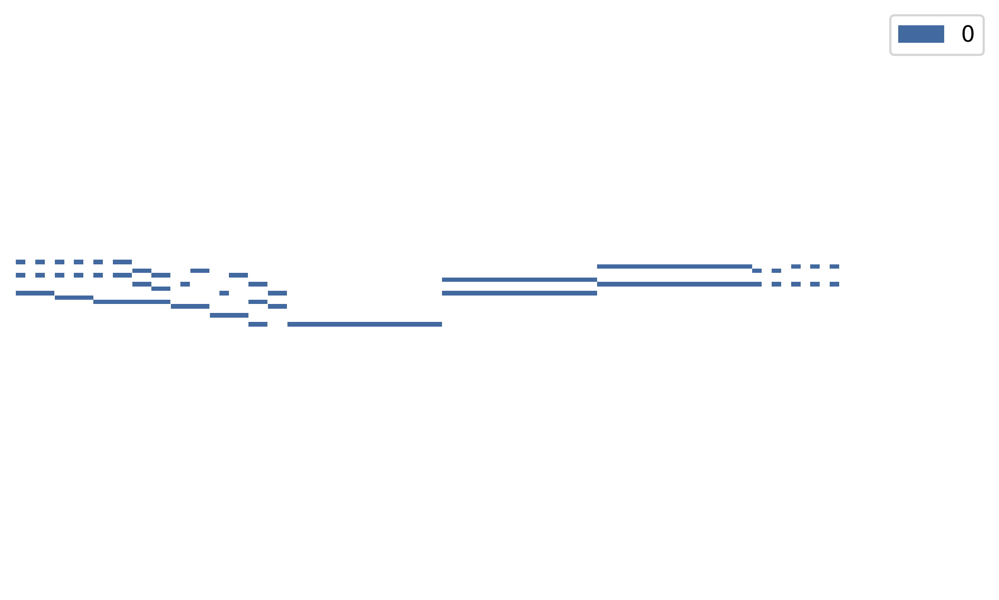

In [14]:
# Human part
visualize(ops.clip([tk - CONTROL_OFFSET for tk in human_events], 0, 30), '')

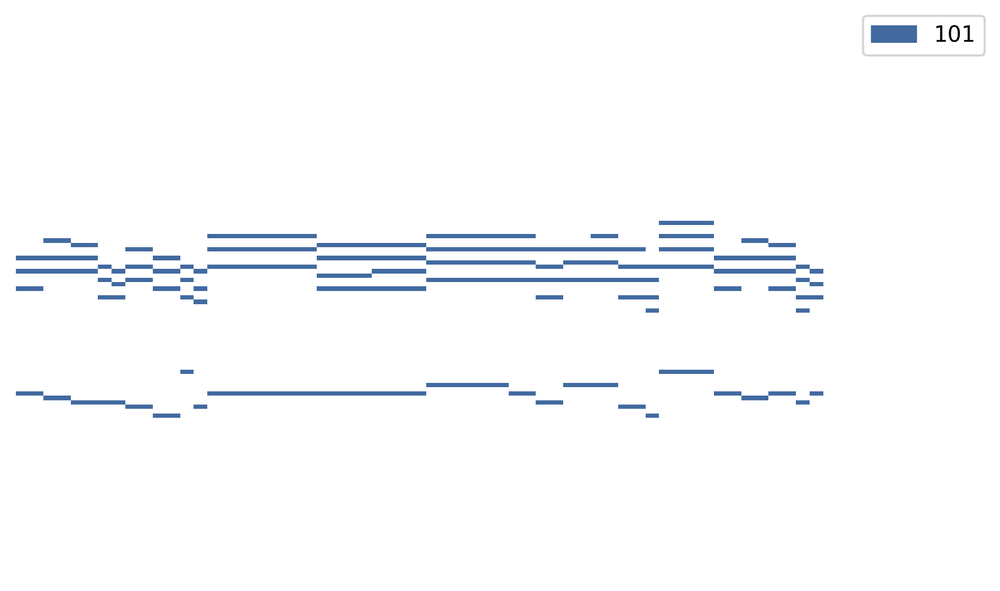

In [15]:
# Chord part
visualize(ops.clip([tk - CONTROL_OFFSET for tk in chord_events], 0, 30), '')

In [31]:
# What are some reasonable instruments to try? Let's look at the original.
ops.get_instruments(events)

defaultdict(int,
            {0: 379,
             35: 44,
             53: 288,
             128: 730,
             29: 100,
             25: 142,
             43: 137,
             117: 656,
             61: 152,
             104: 36,
             119: 66,
             75: 69,
             73: 69})

In [22]:
length = 20
tokens = generate(model, chord_controls=chord_events, human_controls=human_events, start_time=0, end_time=length, instruments=[35, 53, 128, 29, 25, 43, 117], top_p=.98)
print('Tokens generated: ',len(tokens))

 97%|█████████████████████████████████████████████████████████████  | 1938/2000 [00:01<00:00, 1755.73it/s]

Tokens generated:  99


In [20]:
Audio(synthesize(fs, tokens))

Failed to create secure directory (/run/user/20727/pulse): No such file or directory


FluidSynth runtime version 2.1.1
Copyright (C) 2000-2020 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of E-mu Systems, Inc.

Rendering audio to file 'tmp.wav'..


In [28]:
# Let's try with a prompt
length = 30
tokens = generate(model, inputs=ops.clip(events, 0, 10), chord_controls=chord_events, human_controls=human_events, start_time=0, end_time=length, instruments=[35, 53, 128, 29, 25, 43, 117], top_p=.98)
print('Tokens generated: ',len(tokens))

 98%|█████████████████████████████████████████████████████████████▉ | 2952/3000 [00:01<00:00, 1539.49it/s]

Tokens generated:  177


In [29]:
Audio(synthesize(fs, tokens))

Failed to create secure directory (/run/user/20727/pulse): No such file or directory


FluidSynth runtime version 2.1.1
Copyright (C) 2000-2020 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of E-mu Systems, Inc.

Rendering audio to file 'tmp.wav'..
